In [1]:
!git clone -b bsq https://github.com/akash092/MSAI_ADL.git

Cloning into 'MSAI_ADL'...
remote: Enumerating objects: 95, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 95 (delta 17), reused 25 (delta 12), pack-reused 63 (from 1)
Receiving objects: 100% (95/95), 76.44 MiB | 11.98 MiB/s, done.
Resolving deltas: 100% (23/23), done.
Updating files: 100% (58/58), done.


In [2]:
%%capture
!wget https://utexas.box.com/shared/static/qubjm5isldqvyimfj9rsmbnvnbezwcv4.zip -O supertux_data.zip
!unzip supertux_data.zip -d MSAI_ADL/homework2_v5/
%cd MSAI_ADL/homework2_v5/
!pip install -r requirements.txt
!pip install torch
!pip install tensorboard

In [46]:
!python -m homework.train PatchAutoEncoder

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
2025-03-12 08:43:16.063399: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741768996.087240   47137 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741768996.094698   47137 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-12 08:43:16.119018: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
LOCAL_RAN

In [45]:
!python -m homework.train BSQPatchAutoEncoder

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
2025-03-12 08:38:21.025243: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741768701.049316   45696 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741768701.056642   45696 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-12 08:38:21.080942: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
LOCAL_RAN

In [40]:
!python3 -m grader homework -vv

Val grader loaded.
[DEBUG    00:00:000] Loading assignment
[DEBUG    00:00:016] Loading grader
[INFO     00:00:017] Patch AutoEncoder
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
[DEBUG    00:00:031] Loading PatchAutoEncoder from /content/MSAI_ADL/homework2_v5/homework/PatchAutoEncoder.pth
[DEBUG    00:01:795] Validation loss: 0.0016348105389624834
[WARNING  00:01:796]   - Image Reconstruction MSE Loss                      [ 30 / 30  ]
[INFO     00:01:797]  --------------------------------------------------    [  30 /  30 ]
[INFO     00:01:797] BSQ Patch AutoEncoder
[DEBUG    00:01:8

In [8]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [3]:
import torch
from homework.data import ImageDataset
dataset = ImageDataset("train")
data_loader = torch.utils.data.DataLoader(dataset, batch_size=64, num_workers=4, shuffle=True)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [10]:
for data in data_loader:
  x = data
  break
print(f"{x.shape=}")

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [12]:
from homework.ae import PatchAutoEncoder
mymodel = PatchAutoEncoder()

In [28]:
layers = []
latent_dim, patch_size = 128, 25
layers.append(torch.nn.Conv2d(3, latent_dim, patch_size, patch_size))
layers.append(torch.nn.GELU())
padding = (patch_size - 1) // 2 # to preserve input dimension
layers.append(torch.nn.Conv2d(latent_dim, latent_dim, patch_size, 1, padding))
layers.append(torch.nn.GELU())
layers.append(torch.nn.Conv2d(latent_dim, latent_dim, patch_size, 1, padding))
layers.append(torch.nn.GELU())

mymodelnew = torch.nn.Sequential(*layers)

mymodelupconv = torch.nn.ConvTranspose2d(latent_dim, 3, patch_size, patch_size)

In [18]:
def hwc_to_chw(x: torch.Tensor) -> torch.Tensor:
    """
    Convert an arbitrary tensor from (H, W, C) to (C, H, W) format.
    This allows us to switch from trnasformer-style channel-last to pytorch-style channel-first
    images. Works with or without the batch dimension.
    """
    dims = list(range(x.dim()))
    dims = dims[:-3] + [dims[-1]] + [dims[-3]] + [dims[-2]]
    return x.permute(*dims)

def chw_to_hwc(x: torch.Tensor) -> torch.Tensor:
    """
    The opposite of hwc_to_chw. Works with or without the batch dimension.
    """
    dims = list(range(x.dim()))
    dims = dims[:-3] + [dims[-2]] + [dims[-1]] + [dims[-3]]
    return x.permute(*dims)

In [31]:
x= x.float() / 255.0 - 0.5
y = chw_to_hwc(mymodelnew(hwc_to_chw(x)))
z = chw_to_hwc(mymodelupconv(hwc_to_chw(y)))

In [32]:
print(f"{x.shape=} {y.shape=} {z.shape=}")

x.shape=torch.Size([64, 100, 150, 3]) y.shape=torch.Size([64, 4, 6, 128]) z.shape=torch.Size([64, 100, 150, 3])


<div class="markdown-google-sans">
  <h1>Welcome to Colab!</h1>
</div>

<div class="markdown-google-sans">
  <h2>Explore the Gemini API</h2>
  <p>The Gemini API gives you access to Gemini models created by Google DeepMind. Gemini models are built from the ground up to be multimodal, so you can reason seamlessly across text, images, code, and audio.
  </p>

  <strong>How to get started?</strong>
    <ol>
      <li><msg desc="First bullet point of a list explaining how to get started with the Gemini API, this one tells to visit AI studio and log-in with a Google account.">Go to <a href="https://aistudio.google.com/">Google AI Studio</a> and log in with your Google account.</msg></li>
      <li><msg desc="Second bullet point of a list explaining how to get started with the Gemini API, this one tells to create an API key on https://aistudio.google.com/app/apikey."><a href="https://aistudio.google.com/app/apikey">Create an API key</a>.</msg></li>
      <li><msg desc="Third and last bullet point of a list explaining how to get started with the Gemini API, this one tells to open a python or rest quickstart to start playing with the Gemini API.">Use a quickstart for <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/quickstarts/Get_started.ipynb">Python</a>, or call the REST API using <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/quickstarts/rest/Prompting_REST.ipynb">curl</a>.</msg></li>
      </ol>

  <strong>Discover Gemini's advanced capabilities</strong>
    <ul>
      <li><msg desc="Link to the Live API quickstart and its live demo on AI Studio.">Discover the <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/quickstarts/Get_started_LiveAPI.ipynb">multimodal Live API</a> (demo <a href="https://aistudio.google.com/live">here</a>).</msg></li>
      <li><msg desc="Link to the Spatial understanding quickstart and its 3d version.">Learn how to <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/quickstarts/Spatial_understanding.ipynb">analyze images and detect items in your pictures</a> using Gemini (bonus, there's a <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/examples/Spatial_understanding_3d.ipynb">3D version</a> as well!).</msg></li>
      <li><msg desc="Link to the Thinking model quickstart.">Unlock the power of <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/quickstarts/Get_started_thinking.ipynb">Gemini thinking model</a>, capable of solving complex task with its inner thoughts.</msg></li>
    </ul>
      
  <strong>Explore complex use cases</strong>
    <ul>
      <li><msg desc="Link to the search grounding example, using Gemini and google search to gather info on companies.">Use <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/examples/Search_grounding_for_research_report.ipynb">Gemini grounding capabilities</a> to create a report on a company based on what the model can find on internet.</msg></li>
      <li><msg desc="Link to the PDF parsing example, using Gemini multimodal and structured output capabilities to parse invoices and forms.">Extract <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/examples/Pdf_structured_outputs_on_invoices_and_forms.ipynb">invoices and form data from PDF</a> in a structured way.</msg></li>
      <li><msg desc="Link to the Book illustration example, using Gemini and Imagen to generate illustions for an open-source book.">Create <a href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/examples/Book_illustration.ipynb">illustration based on a whole book</a> using Gemini large context window and Imagen.</msg></li>
    </ul>
  <p><msg desc="Link to the cookbook and the Gemini API documentation so that users can learn more about the API.">To learn more, check out the <a href="https://github.com/google-gemini/cookbook">Gemini cookbook</a> or visit the <a href="https://ai.google.dev/docs/">Gemini API documentation</a>.</msg>
  </p>
</div>


<msg desc="Text shown above a link to https://www.youtube.com/watch?v=V7RXyqFUR98 which highlights some helpful features in Colab">Colab now has AI features powered by <a href="https://gemini.google.com">Gemini</a>. The video below provides information on how to use these features, whether you're new to Python, or a seasoned veteran.</msg>

<center>
  <a href="https://www.youtube.com/watch?v=V7RXyqFUR98" target="_blank">
  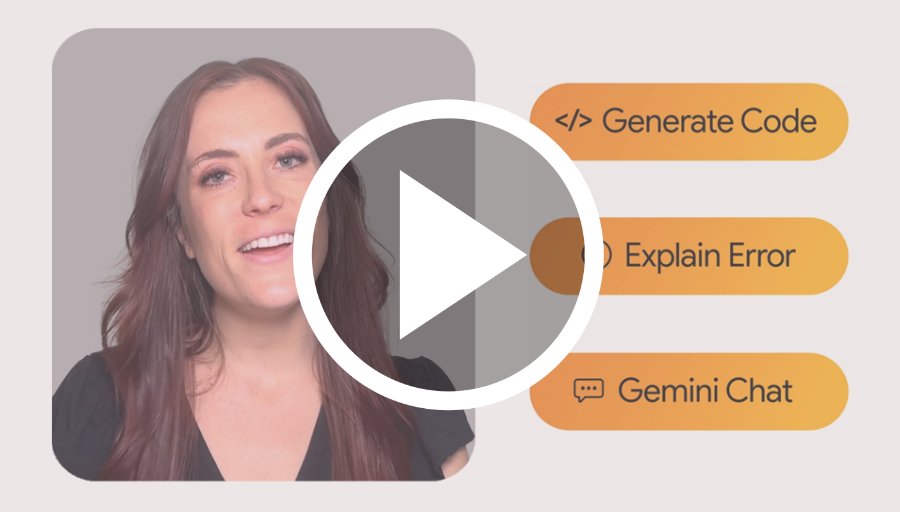
  </a>
</center>

<div class="markdown-google-sans">
  <h2>What is Colab?</h2>
</div>

Colab, or "Colaboratory", allows you to write and execute Python in your browser, with
- Zero configuration required
- Access to GPUs free of charge
- Easy sharing

Whether you're a **student**, a **data scientist** or an **AI researcher**, Colab can make your work easier. Watch [Introduction to Colab](https://www.youtube.com/watch?v=inN8seMm7UI) or [Colab Features You May Have Missed](https://www.youtube.com/watch?v=rNgswRZ2C1Y) to learn more, or just get started below!

<div class="markdown-google-sans">

## **Getting started**
</div>

The document you are reading is not a static web page, but an interactive environment called a **Colab notebook** that lets you write and execute code.

For example, here is a **code cell** with a short Python script that computes a value, stores it in a variable, and prints the result:

In [ ]:
seconds_in_a_day = 24 * 60 * 60
seconds_in_a_day

86400

To execute the code in the above cell, select it with a click and then either press the play button to the left of the code, or use the keyboard shortcut "Command/Ctrl+Enter". To edit the code, just click the cell and start editing.

Variables that you define in one cell can later be used in other cells:

In [ ]:
seconds_in_a_week = 7 * seconds_in_a_day
seconds_in_a_week

604800

Colab notebooks allow you to combine **executable code** and **rich text** in a single document, along with **images**, **HTML**, **LaTeX** and more. When you create your own Colab notebooks, they are stored in your Google Drive account. You can easily share your Colab notebooks with co-workers or friends, allowing them to comment on your notebooks or even edit them. To learn more, see [Overview of Colab](/notebooks/basic_features_overview.ipynb). To create a new Colab notebook you can use the File menu above, or use the following link: [create a new Colab notebook](http://colab.research.google.com#create=true).

Colab notebooks are Jupyter notebooks that are hosted by Colab. To learn more about the Jupyter project, see [jupyter.org](https://www.jupyter.org).

<div class="markdown-google-sans">

## Data science
</div>

With Colab you can harness the full power of popular Python libraries to analyze and visualize data. The code cell below uses **numpy** to generate some random data, and uses **matplotlib** to visualize it. To edit the code, just click the cell and start editing.

You can import your own data into Colab notebooks from your Google Drive account, including from spreadsheets, as well as from Github and many other sources. To learn more about importing data, and how Colab can be used for data science, see the links below under [Working with Data](#working-with-data).

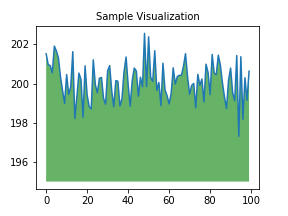

In [ ]:
import numpy as np
import IPython.display as display
from matplotlib import pyplot as plt
import io
import base64

ys = 200 + np.random.randn(100)
x = [x for x in range(len(ys))]

fig = plt.figure(figsize=(4, 3), facecolor='w')
plt.plot(x, ys, '-')
plt.fill_between(x, ys, 195, where=(ys > 195), facecolor='g', alpha=0.6)
plt.title("Sample Visualization", fontsize=10)

data = io.BytesIO()
plt.savefig(data)
image = F"data:image/png;base64,{base64.b64encode(data.getvalue()).decode()}"
alt = "Sample Visualization"
display.display(display.Markdown(F"""![{alt}]({image})"""))
plt.close(fig)

Colab notebooks execute code on Google's cloud servers, meaning you can leverage the power of Google hardware, including [GPUs and TPUs](#using-accelerated-hardware), regardless of the power of your machine. All you need is a browser.

For example, if you find yourself waiting for **pandas** code to finish running and want to go faster, you can switch to a GPU Runtime and use libraries like [RAPIDS cuDF](https://rapids.ai/cudf-pandas) that provide zero-code-change acceleration.

To learn more about accelerating pandas on Colab, see the [10 minute guide](https://colab.research.google.com/github/rapidsai-community/showcase/blob/main/getting_started_tutorials/cudf_pandas_colab_demo.ipynb) or
 [US stock market data analysis demo](https://colab.research.google.com/github/rapidsai-community/showcase/blob/main/getting_started_tutorials/cudf_pandas_stocks_demo.ipynb).

<div class="markdown-google-sans">

## Machine learning
</div>

With Colab you can import an image dataset, train an image classifier on it, and evaluate the model, all in just [a few lines of code](https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/quickstart/beginner.ipynb).

Colab is used extensively in the machine learning community with applications including:
- Getting started with TensorFlow
- Developing and training neural networks
- Experimenting with TPUs
- Disseminating AI research
- Creating tutorials

To see sample Colab notebooks that demonstrate machine learning applications, see the [machine learning examples](#machine-learning-examples) below.

<div class="markdown-google-sans">

## More Resources

### Working with Notebooks in Colab

</div>

- [Overview of Colab](/notebooks/basic_features_overview.ipynb)
- [Guide to Markdown](/notebooks/markdown_guide.ipynb)
- [Importing libraries and installing dependencies](/notebooks/snippets/importing_libraries.ipynb)
- [Saving and loading notebooks in GitHub](https://colab.research.google.com/github/googlecolab/colabtools/blob/main/notebooks/colab-github-demo.ipynb)
- [Interactive forms](/notebooks/forms.ipynb)
- [Interactive widgets](/notebooks/widgets.ipynb)

<div class="markdown-google-sans">

<a name="working-with-data"></a>
### Working with Data
</div>

- [Loading data: Drive, Sheets, and Google Cloud Storage](/notebooks/io.ipynb)
- [Charts: visualizing data](/notebooks/charts.ipynb)
- [Getting started with BigQuery](/notebooks/bigquery.ipynb)

<div class="markdown-google-sans">

### Machine Learning Crash Course

<div>

These are a few of the notebooks from Google's online Machine Learning course. See the [full course website](https://developers.google.com/machine-learning/crash-course/) for more.
- [Intro to Pandas DataFrame](https://colab.research.google.com/github/google/eng-edu/blob/main/ml/cc/exercises/pandas_dataframe_ultraquick_tutorial.ipynb)
- [Intro to RAPIDS cuDF to accelerate pandas](https://nvda.ws/rapids-cudf)
- [Linear regression with tf.keras using synthetic data](https://colab.research.google.com/github/google/eng-edu/blob/main/ml/cc/exercises/linear_regression_with_synthetic_data.ipynb)

<div class="markdown-google-sans">

<a name="using-accelerated-hardware"></a>
### Using Accelerated Hardware
</div>

- [TensorFlow with GPUs](/notebooks/gpu.ipynb)
- [TensorFlow with TPUs](/notebooks/tpu.ipynb)

<div class="markdown-google-sans">

<a name="machine-learning-examples"></a>

### Featured examples

</div>

- [Retraining an Image Classifier](https://tensorflow.org/hub/tutorials/tf2_image_retraining): Build a Keras model on top of a pre-trained image classifier to distinguish flowers.
- [Text Classification](https://tensorflow.org/hub/tutorials/tf2_text_classification): Classify IMDB movie reviews as either *positive* or *negative*.
- [Style Transfer](https://tensorflow.org/hub/tutorials/tf2_arbitrary_image_stylization): Use deep learning to transfer style between images.
- [Multilingual Universal Sentence Encoder Q&A](https://tensorflow.org/hub/tutorials/retrieval_with_tf_hub_universal_encoder_qa): Use a machine learning model to answer questions from the SQuAD dataset.
- [Video Interpolation](https://tensorflow.org/hub/tutorials/tweening_conv3d): Predict what happened in a video between the first and the last frame.
